In [6]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)
import os
print(os.getcwd())
df = pd.read_csv("C:/Users/Windows/house price/Chennai houseing sale.csv")




C:\Users\Windows\house price


In [7]:
df.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,P03210,Karapakkam,1004,04-05-2011,131,1.0,1.0,3,AbNormal,Yes,15-05-1967,Commercial,AllPub,Paved,A,4.0,3.9,4.9,4.330,380000,144400,7600000
1,P09411,Anna Nagar,1986,19-12-2006,26,2.0,1.0,5,AbNormal,No,22-12-1995,Commercial,AllPub,Gravel,RH,4.9,4.2,2.5,3.765,760122,304049,21717770
2,P01812,Adyar,909,04-02-2012,70,1.0,1.0,3,AbNormal,Yes,09-02-1992,Commercial,ELO,Gravel,RL,4.1,3.8,2.2,3.090,421094,92114,13159200
3,P05346,Velachery,1855,13-03-2010,14,3.0,2.0,5,Family,No,18-03-1988,Others,NoSewr,Paved,I,4.7,3.9,3.6,4.010,356321,77042,9630290
4,P06210,Karapakkam,1226,05-10-2009,84,1.0,1.0,3,AbNormal,Yes,13-10-1979,Others,AllPub,Gravel,C,3.0,2.5,4.1,3.290,237000,74063,7406250


In [8]:
# A Quick Information abou the Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7109 entries, 0 to 7108
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PRT_ID         7109 non-null   object 
 1   AREA           7109 non-null   object 
 2   INT_SQFT       7109 non-null   int64  
 3   DATE_SALE      7109 non-null   object 
 4   DIST_MAINROAD  7109 non-null   int64  
 5   N_BEDROOM      7108 non-null   float64
 6   N_BATHROOM     7104 non-null   float64
 7   N_ROOM         7109 non-null   int64  
 8   SALE_COND      7109 non-null   object 
 9   PARK_FACIL     7109 non-null   object 
 10  DATE_BUILD     7109 non-null   object 
 11  BUILDTYPE      7109 non-null   object 
 12  UTILITY_AVAIL  7109 non-null   object 
 13  STREET         7109 non-null   object 
 14  MZZONE         7109 non-null   object 
 15  QS_ROOMS       7109 non-null   float64
 16  QS_BATHROOM    7109 non-null   float64
 17  QS_BEDROOM     7109 non-null   float64
 18  QS_OVERA

In [9]:
# Size of the data 
df.shape

(7109, 22)

In [10]:
# Checking for Null Values
df.isnull().sum()

PRT_ID            0
AREA              0
INT_SQFT          0
DATE_SALE         0
DIST_MAINROAD     0
N_BEDROOM         1
N_BATHROOM        5
N_ROOM            0
SALE_COND         0
PARK_FACIL        0
DATE_BUILD        0
BUILDTYPE         0
UTILITY_AVAIL     0
STREET            0
MZZONE            0
QS_ROOMS          0
QS_BATHROOM       0
QS_BEDROOM        0
QS_OVERALL       48
REG_FEE           0
COMMIS            0
SALES_PRICE       0
dtype: int64

In [11]:
# Replacing the Null Values with mean values of the data using Simple Imputer
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(missing_values=np.nan,strategy='mean',fill_value=None)
df['N_BEDROOM']=imputer.fit_transform(df[['N_BEDROOM']])
df['N_BATHROOM']=imputer.fit_transform(df[['N_BATHROOM']])
df['QS_OVERALL']=imputer.fit_transform(df[['QS_OVERALL']])

In [12]:
# lets see the unique values of columns
for col in df.columns:
    if df[col].dtype=='object':
        print()
        print(col)
        print(df[col].unique())


PRT_ID
['P03210' 'P09411' 'P01812' ... 'P09594' 'P06508' 'P09794']

AREA
['Karapakkam' 'Anna Nagar' 'Adyar' 'Velachery' 'Chrompet' 'KK Nagar'
 'TNagar' 'T Nagar' 'Chrompt' 'Chrmpet' 'Karapakam' 'Ana Nagar' 'Chormpet'
 'Adyr' 'Velchery' 'Ann Nagar' 'KKNagar']

DATE_SALE
['04-05-2011' '19-12-2006' '04-02-2012' ... '28-03-2014' '25-08-2006'
 '13-07-2005']

SALE_COND
['AbNormal' 'Family' 'Partial' 'AdjLand' 'Normal Sale' 'Ab Normal'
 'Partiall' 'Adj Land' 'PartiaLl']

PARK_FACIL
['Yes' 'No' 'Noo']

DATE_BUILD
['15-05-1967' '22-12-1995' '09-02-1992' ... '01-09-1978' '11-08-1977'
 '24-07-1961']

BUILDTYPE
['Commercial' 'Others' 'Other' 'House' 'Comercial']

UTILITY_AVAIL
['AllPub' 'ELO' 'NoSewr ' 'NoSeWa' 'All Pub']

STREET
['Paved' 'Gravel' 'No Access' 'Pavd' 'NoAccess']

MZZONE
['A' 'RH' 'RL' 'I' 'C' 'RM']


In [13]:
# Cleaning the Data 
df.AREA.replace(['Ana Nagar','Ann Nagar'],'Anna Nagar',inplace=True)
df.AREA.replace('Karapakkam','Karapakam',inplace=True)
df.AREA.replace(['Chrompt','Chrmpet','Chormpet'],'Chrompet',inplace=True)
df.AREA.replace('KKNagar','KK Nagar',inplace=True)
df.AREA.replace('TNagar','T Nagar',inplace=True)
df.AREA.replace('Adyr','Adyar',inplace=True)
df.AREA.replace('Velchery','Velachery',inplace=True)
df.BUILDTYPE.replace('Comercial','Commercial',inplace=True)
df.BUILDTYPE.replace('Other','Others',inplace=True)
df.UTILITY_AVAIL.replace('AllPub','All Pub',inplace=True)
df.UTILITY_AVAIL.replace('NoSewr','NoSeWa',inplace=True)
df.UTILITY_AVAIL.replace('NoSewr ','NoSeWa',inplace=True)
df.SALE_COND.replace('Ab Normal','AbNormal',inplace=True)
df.SALE_COND.replace(['PartiaLl','Partiall'],'Partial',inplace=True)
df.SALE_COND.replace('Adj Land','AdjLand',inplace=True)
df.PARK_FACIL.replace('Noo','No',inplace=True)
df.STREET.replace('Pavd','Paved',inplace=True)
df.STREET.replace('NoAccess','No Access',inplace=True)

In [14]:
#Changing the datatype from float to int
df.QS_ROOMS=df.QS_ROOMS.astype(int)
df.QS_BATHROOM=df.QS_BATHROOM.astype(int)
df.QS_BEDROOM=df.QS_BEDROOM.astype(int)
df.N_BEDROOM=df.N_BEDROOM.astype(int)
df.N_BATHROOM=df.N_BATHROOM.astype(int)

In [15]:
df.head(3)

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,P03210,Karapakam,1004,04-05-2011,131,1,1,3,AbNormal,Yes,15-05-1967,Commercial,All Pub,Paved,A,4,3,4,4.330,380000,144400,7600000
1,P09411,Anna Nagar,1986,19-12-2006,26,2,1,5,AbNormal,No,22-12-1995,Commercial,All Pub,Gravel,RH,4,4,2,3.765,760122,304049,21717770
2,P01812,Adyar,909,04-02-2012,70,1,1,3,AbNormal,Yes,09-02-1992,Commercial,ELO,Gravel,RL,4,3,2,3.090,421094,92114,13159200


In [16]:
# Stastical Description of Data
df.describe()

,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
count,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7109.000000,7.109000e+03
mean,1382.073006,99.603179,1.636939,1.213110,3.688704,3.075538,3.069349,3.056126,3.503254,376938.330708,141005.726544,1.089491e+07
std,457.410902,57.403110,0.802881,0.409534,1.019099,0.872937,0.876024,0.871499,0.525440,143070.662010,78768.093718,3.768603e+06
min,500.000000,0.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,71177.000000,5055.000000,2.156875e+06
25%,993.000000,50.000000,1.000000,1.000000,3.000000,2.000000,2.000000,2.000000,3.130000,272406.000000,84219.000000,8.272100e+06
50%,1373.000000,99.000000,1.000000,1.000000,4.000000,3.000000,3.000000,3.000000,3.503254,349486.000000,127628.000000,1.033505e+07
75%,1744.000000,148.000000,2.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.880000,451562.000000,184506.000000,1.299390e+07
max,2500.000000,200.000000,4.000000,2.000000,6.000000,5.000000,5.000000,5.000000,4.970000,983922.000000,495405.000000,2.366734e+07


In [17]:
df.AREA.value_counts()

AREA
Chrompet      1702
Karapakam     1366
KK Nagar       997
Velachery      981
Anna Nagar     788
Adyar          774
T Nagar        501
Name: count, dtype: int64

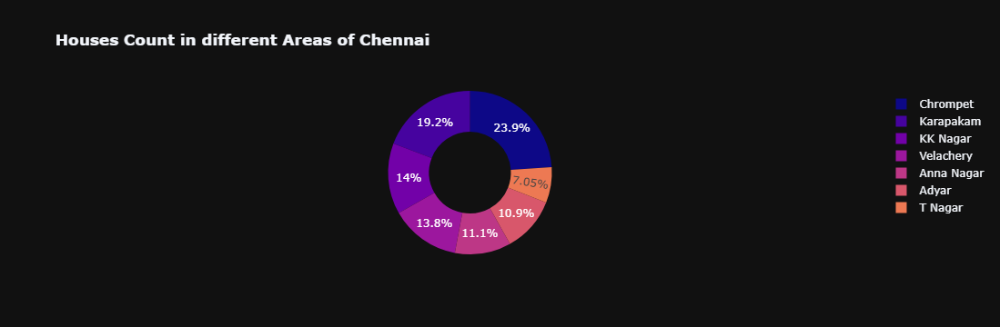

In [18]:
px.pie(df.groupby('AREA',as_index=False)['PRT_ID'].count(),values='PRT_ID',names='AREA',labels={'PRT_ID':'Count'},template='plotly_dark',color_discrete_sequence=px.colors.sequential.Plasma,hole=.5,title='<b> Houses Count in different Areas of Chennai</b>')

How the Sales Price of Houses varies with Different Areas in Chennai ?
T Nagar and Anna Nagar Area Houses Has Maximum Sales Price and KK Nagar Area Houses are second Max Sales Price
Karapakam Area Houses has Less Sales Price When Compared to other Area Houses

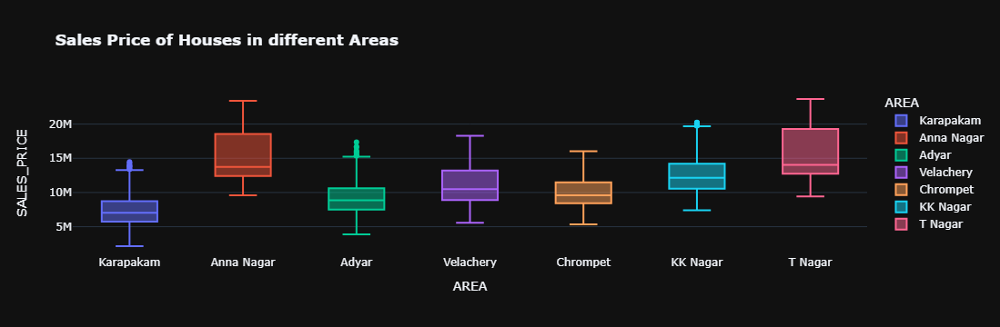

In [19]:
px.box(df,x='AREA',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b> Sales Price of Houses in different Areas')

How the Square Foot of the House will Effect the Sales Price?
Increase in Square Foot of Houses increases the Sales price of Houses
As we can see the Houses Related to Same Area Having Almost Similar Square feet Length
T Nagar and Anna Nagar Area Houses has Maximum Price Having Square Foot in the Range of 1500 to 2000
KK Nagar Area Houses Has high Square foots from 1400 to 2500

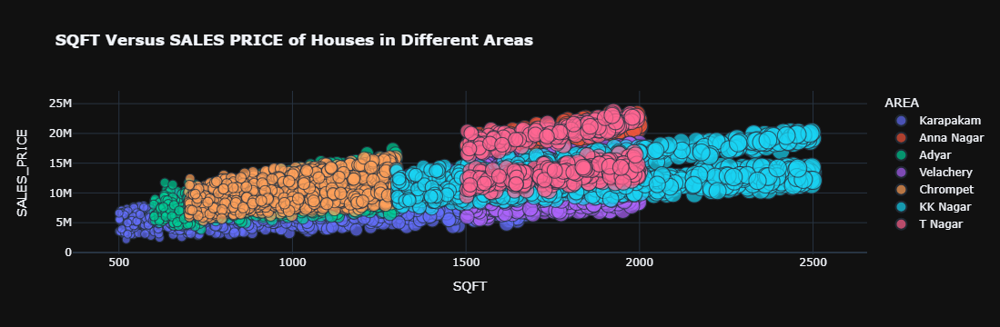

In [20]:
px.scatter(df,x='INT_SQFT',y='SALES_PRICE',color='AREA',size='INT_SQFT',labels={'INT_SQFT':'SQFT'},template='plotly_dark',title='<b> SQFT Versus SALES PRICE of Houses in Different Areas')

How does Sales Price Depends on the Main Road Distance From the House?
It Seems Like MainRoad Distance Does Not Affecting the Sales Price of Houses
The Price is same for the Houses having shorter Main Road Distance and Larger Main Road Distance
So the Main Road Distance is Not influencing More on Sales Price

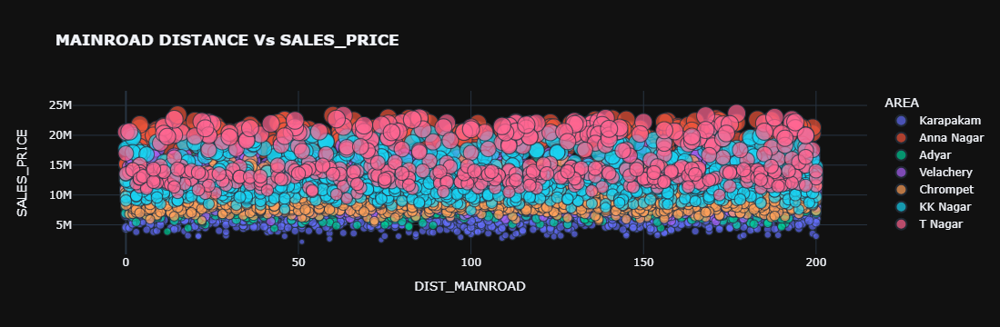

In [21]:
px.scatter(df,x='DIST_MAINROAD',y='SALES_PRICE',color='AREA',size='SALES_PRICE',template='plotly_dark',title='<b> MAINROAD DISTANCE Vs SALES_PRICE')

How the Sales Price Depends On the Build Date and Sale Date of Houses ?

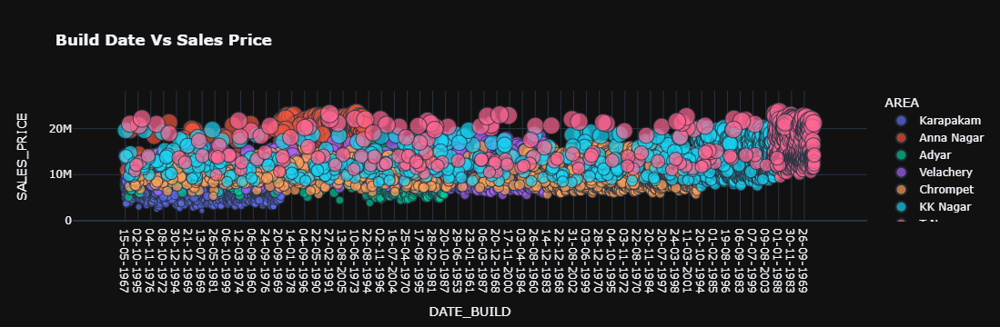

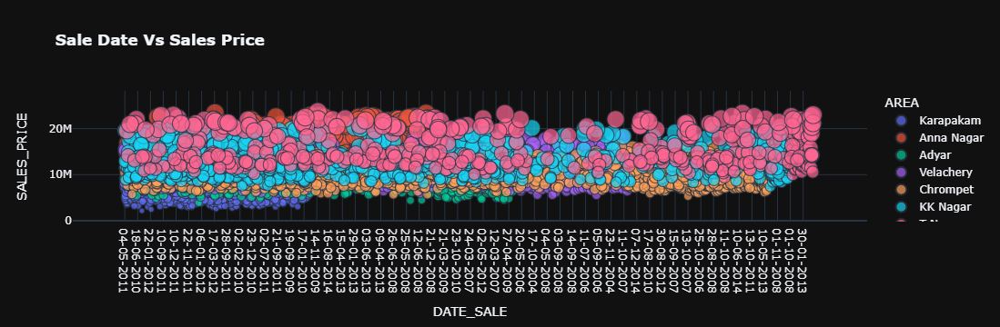

In [22]:
fig=px.scatter(df,x='DATE_BUILD',y='SALES_PRICE',color='AREA',size='SALES_PRICE',template='plotly_dark',title='<b> Build Date Vs Sales Price')
fig.show()
fig=px.scatter(df,x='DATE_SALE',y='SALES_PRICE',color='AREA',size='SALES_PRICE',template='plotly_dark',title='<b> Sale Date Vs Sales Price')
fig.show()

How the Sales Price Depends On Number of Rooms ?
As we can see increase in Rooms Count increases the Sales Price of Houses
Houses having total Four and Five Rooms in the areas of Anna Nagar,Velacherry,KK Nagar and T Nagar Has Maximum Sales Price
Karapakam,Adyar and Chrompet Area Houses having Two to Four Rooms but four room houses has maximum sales price when compared to others
Anna Nagar,Velacherry and T Nagar Areas consists of Four to Five Room Houses
KK Nagar Area Houses consists of Two to six Rooms and the price incresases with increase in the Room Countwhen compared to others
Anna Nagar,Velacherry and T Nagar Areas consists of Four to Five Room Houses
KK Nagar Area Houses consists of Two to six Rooms and the price incresases with increase in the Room Coun

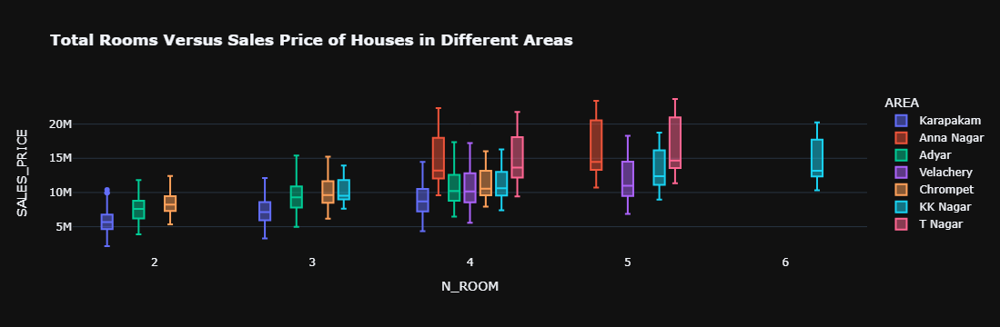

In [23]:
px.box(df,x='N_ROOM',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b>Total Rooms Versus Sales Price of Houses in Different Areas')

How the Sales Price Depends On Number of Bed Rooms ?
Increase in Bed Rooms Increases the Sales Price
Anna Nagar,T Nagar,Adyar,Karapakam and Chrompet Area Houses consists of one to two bedrooms but two bedroom houses has maximum sales price in these areas
KK Nagar Area Consists of Houses having one to four bedrooms and Sales price increases with increase in bedrooms
Velacherry Area Houses Consists of two to three Bedrooms
Out of all Anna Nagar and T Nagar Area Houses with two Bedrooms has Maximum Sales Price


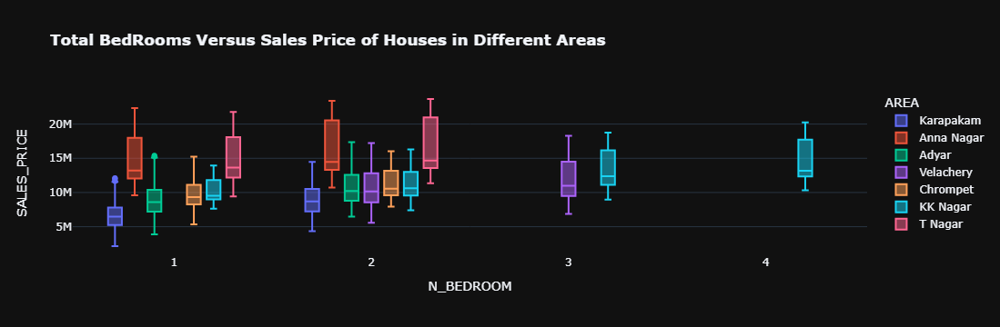

In [24]:
px.box(df,x='N_BEDROOM',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b>Total BedRooms Versus Sales Price of Houses in Different Areas')

How the Sales Price Depends On the Number of Bath Rooms ?
Increase in Bathrooms Increases the Sales Price in all Areas
Anna Nagar and T Nagar Area houses Having only one Bathroom Has Maximum Sales Price when Compared to other Areas

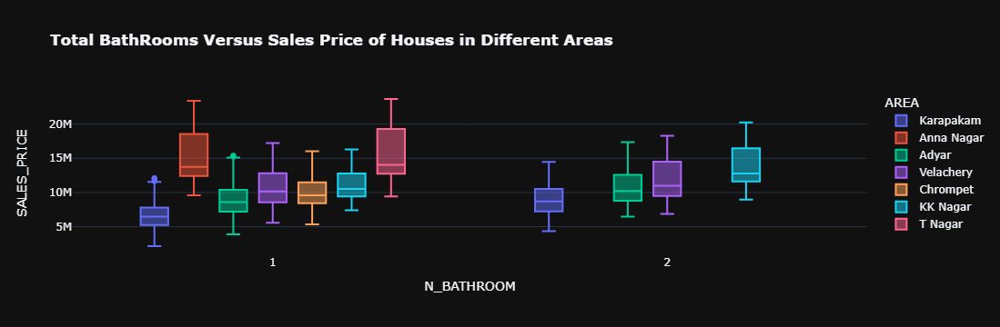

In [25]:
px.box(df,x='N_BATHROOM',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b>Total BathRooms Versus Sales Price of Houses in Different Areas')

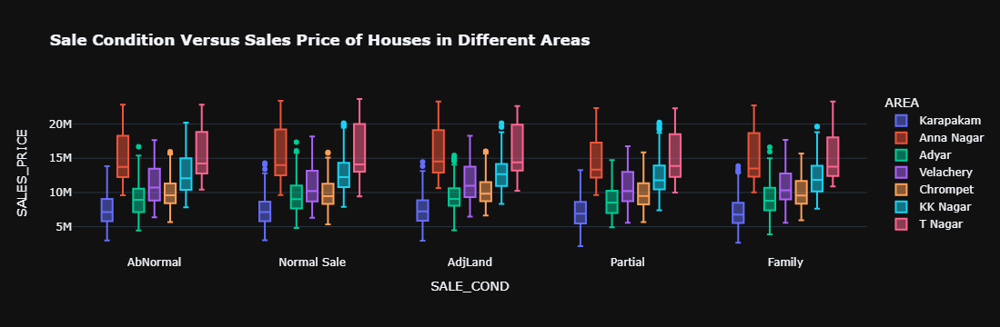

In [26]:
px.box(df,x='SALE_COND',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b>Sale Condition Versus Sales Price of Houses in Different Areas')

How the Sales Price Depends On the Parking Facility of the Houses?
Sales Price is Maximum for the Houses having Parking Facility in Different Areas


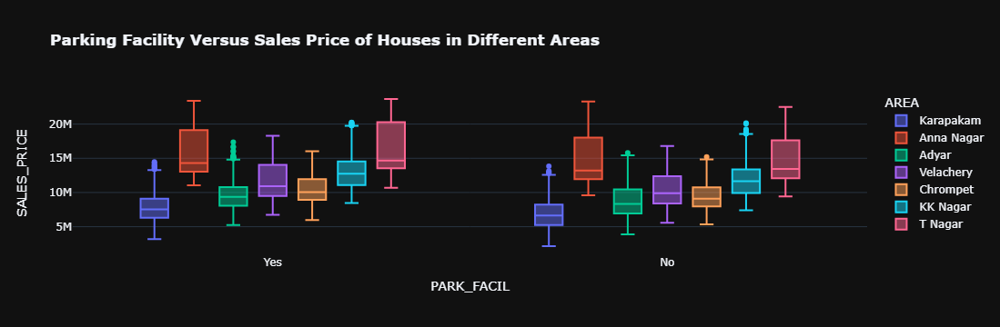

In [27]:
px.box(df,x='PARK_FACIL',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b>Parking Facility Versus Sales Price of Houses in Different Areas')

How the Sales Price Depends On the Build Type of the Houses?
Sales Price is Maximum for the Houses having Commercial Build Type in Different Areas

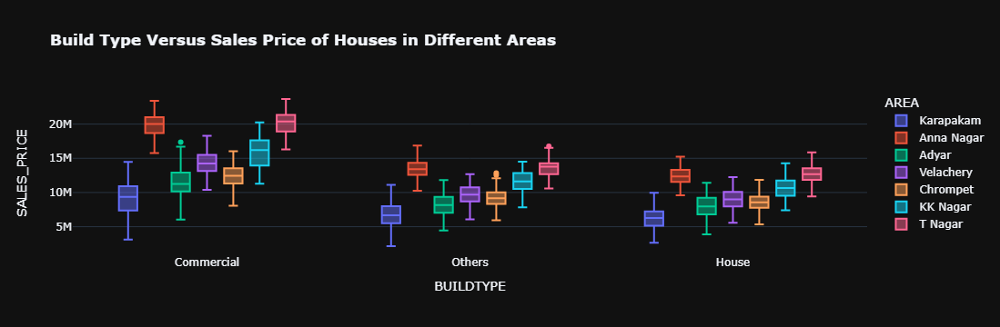

In [28]:
px.box(df,x='BUILDTYPE',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b>Build Type Versus Sales Price of Houses in Different Areas')

How the Sales Price Depends On the Street Type of the Houses?
Sales Price is almost equal for all the Houses Having different Streets in different Areas

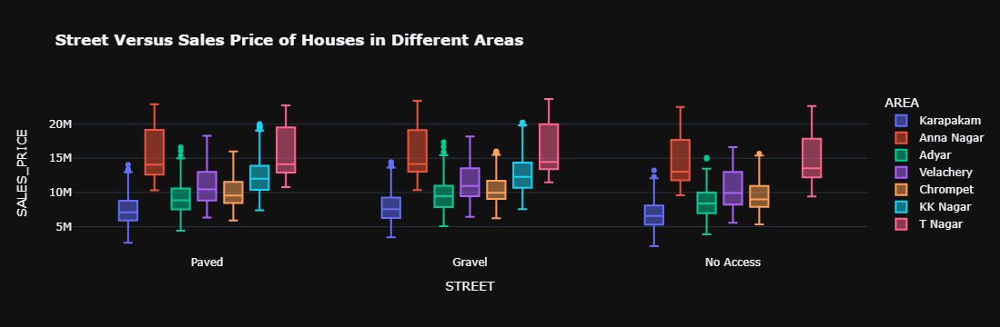

In [29]:
px.box(df,x='STREET',y='SALES_PRICE',color='AREA',template='plotly_dark',title='<b> Street Versus Sales Price of Houses in Different Areas')

In [30]:
df_numeric = df.select_dtypes(include=[np.number])
correlation_matrix = df_numeric.corr()
print(correlation_matrix)


               INT_SQFT  DIST_MAINROAD  N_BEDROOM  N_BATHROOM    N_ROOM  \
INT_SQFT       1.000000       0.002022   0.786263    0.515290  0.951279   
DIST_MAINROAD  0.002022       1.000000  -0.002723    0.001850  0.002301   
N_BEDROOM      0.786263      -0.002723   1.000000    0.755207  0.840209   
N_BATHROOM     0.515290       0.001850   0.755207    1.000000  0.568541   
N_ROOM         0.951279       0.002301   0.840209    0.568541  1.000000   
QS_ROOMS       0.016146       0.013050   0.011434    0.010452  0.013468   
QS_BATHROOM   -0.011463      -0.021857  -0.008603   -0.011005 -0.009066   
QS_BEDROOM     0.005847       0.002757   0.014449    0.013390  0.012072   
QS_OVERALL     0.013989      -0.017255   0.014245    0.007961  0.015418   
REG_FEE        0.657544       0.011600   0.455380    0.260244  0.630932   
COMMIS         0.571076       0.010994   0.430446    0.256726  0.533343   
SALES_PRICE    0.612125       0.018783   0.330987    0.108834  0.602760   

               QS_ROOMS 

Pairwise Correlation of All Columns in the Data

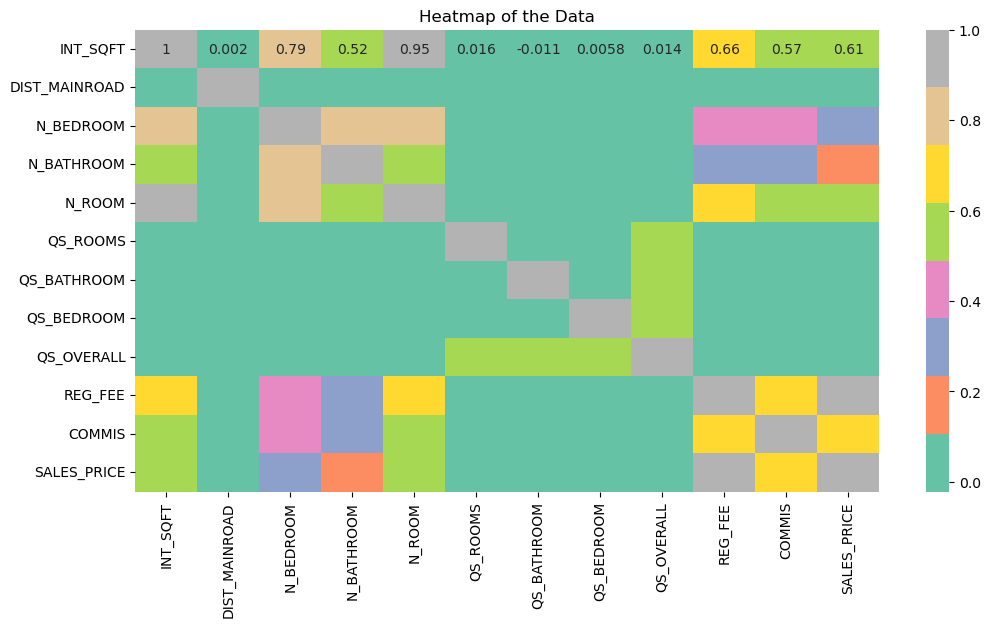

In [31]:
# Select only numeric columns
df_numeric = df.select_dtypes(include=[np.number])

# Now, calculate the correlation matrix on the numeric data
plt.figure(figsize=(12,6))
sns.heatmap(df_numeric.corr(), annot=True, cmap='Set2')
plt.title('Heatmap of the Data')
plt.show()


In [32]:
# Creating a Back up File
df_bk=df.copy()

In [33]:
# Coverting the labels into a numeric form using Label Encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])

In [34]:
df.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,2266,4,1004,310,131,1,1,3,0,1,2731,0,0,2,0,4,3,4,4.330,380000,144400,7600000
1,6664,1,1986,1745,26,2,1,5,0,0,4226,0,0,0,3,4,4,2,3.765,760122,304049,21717770
2,1270,0,909,288,70,1,1,3,0,1,1511,0,1,0,4,4,3,2,3.090,421094,92114,13159200
3,3755,6,1855,1117,14,3,2,5,2,0,3300,2,2,2,2,4,3,3,4.010,356321,77042,9630290
4,4393,4,1226,442,84,1,1,3,0,1,2406,2,0,0,1,3,2,4,3.290,237000,74063,7406250


In [35]:
# storing the Dependent Variables in X and Independent Variable in Y
x=df.drop('SALES_PRICE',axis=1)
y=df['SALES_PRICE']

In [36]:
# Splitting the Data into Training set and Testing Set
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=42)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((4976, 21), (2133, 21), (4976,), (2133,))

In [37]:
# Scaling the values to convert the int values to Machine Languages
from sklearn.preprocessing import MinMaxScaler
mmscaler=MinMaxScaler(feature_range=(0,1))
x_train=mmscaler.fit_transform(x_train)
x_test=mmscaler.fit_transform(x_test)
x_train=pd.DataFrame(x_train)
x_test=pd.DataFrame(x_test)

In [38]:
a={'Model Name':[], 'Mean_Absolute_Error_MAE':[] ,'Adj_R_Square':[] ,'Root_Mean_Squared_Error_RMSE':[] ,'Mean_Absolute_Percentage_Error_MAPE':[] ,'Mean_Squared_Error_MSE':[] ,'Root_Mean_Squared_Log_Error_RMSLE':[] ,'R2_score':[]}
Results=pd.DataFrame(a)
Results.head()

,Model Name,Mean_Absolute_Error_MAE,Adj_R_Square,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score


In [39]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


In [40]:
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics

# Create objects of Regression / Regressor models with default hyper-parameters
modelmlg = LinearRegression()
modeldcr = DecisionTreeRegressor()
modelrfr = RandomForestRegressor()
modelSVR = SVR()
modelXGR = xgb.XGBRegressor()
modelKNN = KNeighborsRegressor(n_neighbors=5)
modelETR = ExtraTreesRegressor()

# Updated GradientBoostingRegressor
modelGBR = GradientBoostingRegressor(loss='squared_error', learning_rate=0.1, n_estimators=100, subsample=1.0,
                                     criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1,
                                     min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0,
                                     init=None, random_state=None, max_features=None,
                                     alpha=0.9, verbose=0, max_leaf_nodes=None, warm_start=False,
                                     validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)

# List of models
MM = [modelmlg, modeldcr, modelrfr, modelKNN, modelETR, modelGBR, modelXGR]

# Initialize an empty DataFrame to store results
Results = pd.DataFrame(columns=['Model Name', 'Mean_Absolute_Error_MAE', 'Adj_R_Square', 
                                'Root_Mean_Squared_Error_RMSE', 'Mean_Absolute_Percentage_Error_MAPE', 
                                'Mean_Squared_Error_MSE', 'Root_Mean_Squared_Log_Error_RMSLE', 'R2_score'])

# Function to calculate MAPE - Mean Absolute Percentage Error
def MAPE(y_test, y_pred):
    y_test, y_pred = np.array(y_test), np.array(y_pred)
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Loop over all models
for models in MM:
    # Fit the model with train data
    models.fit(x_train, y_train)
    
    # Predict the model with test data
    y_pred = models.predict(x_test)
    
    # Print the model name
    print('Model Name: ', models)
    
    # Evaluation metrics for Regression analysis
    print('Mean Absolute Error (MAE):', round(metrics.mean_absolute_error(y_test, y_pred), 3))  
    print('Mean Squared Error (MSE):', round(metrics.mean_squared_error(y_test, y_pred), 3))  
    print('Root Mean Squared Error (RMSE):', round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)), 3))
    print('R2_score:', round(metrics.r2_score(y_test, y_pred), 6))
    print('Root Mean Squared Log Error (RMSLE):', round(np.log(np.sqrt(metrics.mean_squared_error(y_test, y_pred))), 3))
    
    # Evaluation of MAPE
    result = MAPE(y_test, y_pred)
    print('Mean Absolute Percentage Error (MAPE):', round(result, 2), '%')
    
    # Calculate Adjusted R squared values 
    r_squared = round(metrics.r2_score(y_test, y_pred), 6)
    adjusted_r_squared = round(1 - (1 - r_squared) * (len(y) - 1) / (len(y) - x.shape[1] - 1), 6)
    print('Adj R Square: ', adjusted_r_squared)
    print('------------------------------------------------------------------------------------------------------------')
    
    # Create a dictionary for the new row of results
    new_row = {'Model Name': models,
               'Mean_Absolute_Error_MAE': metrics.mean_absolute_error(y_test, y_pred),
               'Adj_R_Square': adjusted_r_squared,
               'Root_Mean_Squared_Error_RMSE': np.sqrt(metrics.mean_squared_error(y_test, y_pred)),
               'Mean_Absolute_Percentage_Error_MAPE': result,
               'Mean_Squared_Error_MSE': metrics.mean_squared_error(y_test, y_pred),
               'Root_Mean_Squared_Log_Error_RMSLE': np.log(np.sqrt(metrics.mean_squared_error(y_test, y_pred))),
               'R2_score': metrics.r2_score(y_test, y_pred)}
    
    # Convert new_row into a DataFrame and concatenate it with Results
    Results = pd.concat([Results, pd.DataFrame([new_row])], ignore_index=True)

# Display the final Results
print(Results)


Model Name:  LinearRegression()
Mean Absolute Error (MAE): 1045206.852
Mean Squared Error (MSE): 1725342669531.458
Root Mean Squared Error (RMSE): 1313522.999
R2_score: 0.872777
Root Mean Squared Log Error (RMSLE): 14.088
Mean Absolute Percentage Error (MAPE): 10.26 %
Adj R Square:  0.8724
------------------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeRegressor()
Mean Absolute Error (MAE): 807364.238
Mean Squared Error (MSE): 1100333023788.912
Root Mean Squared Error (RMSE): 1048967.599
R2_score: 0.918864
Root Mean Squared Log Error (RMSLE): 13.863
Mean Absolute Percentage Error (MAPE): 8.21 %
Adj R Square:  0.918624
------------------------------------------------------------------------------------------------------------
Model Name:  RandomForestRegressor()
Mean Absolute Error (MAE): 596961.83
Mean Squared Error (MSE): 560804162024.386
Root Mean Squared Error (RMSE): 748868.588
R2_score: 0.958647
Root Mean Square

From the above Results, the Top 3 Models by Comparing Adjacent R Square Values are
ExtraTreesRegressor
XGBRegressor
GradientBoostingRegressor
Training and Predicting with ExtraTreesRegresso

In [57]:
print("Shape of x_train:", x_train.shape)


Shape of x_train: (4976, 21)


In [59]:
x_train.columns = [
    'INT_SQFT', 'DIST_MAINROAD', 'N_BEDROOM', 'N_BATHROOM', 'N_ROOM',
    'QS_ROOMS', 'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE',
    'COMMIS', 'SALE_COND', 'PARK_FACIL', 'BUILDTYPE', 'UTILITY_AVAIL',
    'STREET', 'MZZONE', 'DATE_BUILD', 'DATE_SALE', 'AREA', 'PRT_ID'
]

In [60]:
# Training the Model

modelETR.fit(x_train, y_train)
    
# Predict the model with test data

y_pred = modelXGR.predict(x_test)

In [61]:
out=pd.DataFrame({'Price_actual':y_test,'Price_pred':y_pred})
result=df_bk.merge(out,left_index=True,right_index=True)

In [46]:
# Example: Display result DataFrame if needed
print(result.head())

    PRT_ID        AREA  INT_SQFT   DATE_SALE  DIST_MAINROAD  N_BEDROOM  \
8   P03377    Chrompet       771  06-04-2011            175          1   
14  P04085   Velachery      1865  11-11-2010            157          3   
15  P06328   Velachery      1868  12-09-2009            148          3   
17  P02016    Chrompet       796  25-12-2011            134          1   
19  P01372  Anna Nagar      1902  02-07-2012            168          2   

    N_BATHROOM  N_ROOM SALE_COND PARK_FACIL  DATE_BUILD   BUILDTYPE  \
8            1       2   AdjLand         No  14-04-1977      Others   
14           2       5    Family         No  24-11-1956  Commercial   
15           2       5    Family         No  14-09-2000  Commercial   
17           1       2   AdjLand        Yes  03-01-1975  Commercial   
19           1       5    Family        Yes  13-07-1970  Commercial   

   UTILITY_AVAIL     STREET MZZONE  QS_ROOMS  QS_BATHROOM  QS_BEDROOM  \
8         NoSeWa      Paved     RM         2           

In [62]:
result[['PRT_ID', 'AREA', 'INT_SQFT', 'DATE_SALE', 'N_BEDROOM', 'N_BATHROOM', 'SALE_COND', 'PARK_FACIL', 
        'DATE_BUILD', 'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS', 'QS_BATHROOM', 
        'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE', 'COMMIS', 'SALES_PRICE', 'Price_actual', 'Price_pred']].sample(20)


,PRT_ID,AREA,INT_SQFT,DATE_SALE,N_BEDROOM,N_BATHROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE,Price_actual,Price_pred
911,P01789,Velachery,1511,08-02-2012,2,1,Family,No,16-02-1979,House,NoSeWa,Gravel,A,2,2,4,3.170000,247987,127345,6702360,6702360,6754742.5
2439,P06894,Velachery,1638,26-04-2009,2,1,Family,Yes,06-05-1969,House,NoSeWa,Gravel,RM,3,4,4,4.410000,412068,206034,10843900,10843900,11049138.0
3133,P00139,Anna Nagar,1767,13-11-2014,1,1,AdjLand,No,23-11-1973,Commercial,NoSeWa,No Access,RH,3,5,4,4.270000,496863,147219,18402320,18402320,18362810.0
339,P06556,KK Nagar,1917,25-07-2009,3,2,Family,Yes,30-07-1991,House,All Pub,Paved,RL,2,4,3,3.610000,342425,276149,11045960,11045960,11753629.0
2534,P04114,Karapakam,1116,03-11-2010,1,1,AdjLand,No,08-11-1990,Others,All Pub,No Access,C,4,4,5,4.700000,273886,89432,5589500,5589500,5838118.5
5889,P07755,Chrompet,791,11-08-2008,1,1,AbNormal,Yes,13-08-2003,Others,ELO,No Access,RM,3,2,2,2.910000,262423,131211,8747420,8747420,8703154.0
2318,P00312,Chrompet,721,09-07-2014,1,1,Family,Yes,17-07-1982,Others,NoSeWa,No Access,RM,2,3,2,3.150000,222526,47684,7947370,7947370,7495862.0
6947,P07406,KK Nagar,2340,21-11-2008,4,2,Family,Yes,27-11-1987,House,NoSeWa,Paved,RL,3,2,4,3.590000,421450,180621,12041420,12041420,12124248.0
5365,P03453,Velachery,1514,23-03-2011,2,1,Partial,No,02-04-1971,Others,NoSeWa,Gravel,RH,2,4,4,4.180000,330628,151910,8935900,8935900,9132748.0
1536,P04530,T Nagar,1568,14-08-2010,1,1,AdjLand,No,18-08-1993,Others,All Pub,Gravel,RH,3,2,3,3.110000,320072,153635,12802880,12802880,11880624.0


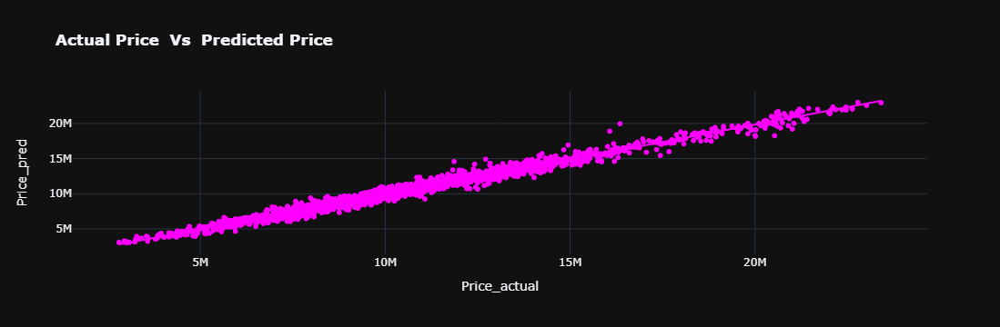

In [44]:
px.scatter(result,x='Price_actual',y='Price_pred',trendline='ols',color_discrete_sequence=['magenta'],template='plotly_dark',title='<b> Actual Price  Vs  Predicted Price ')

In [50]:
# Assuming the DataFrame is named 'result' and you want to filter by PRT_ID = 107
specific_row = result[result['PRT_ID'] =='P01961']

# Display the result
print(specific_row[['PRT_ID', 'AREA', 'INT_SQFT', 'DATE_SALE', 'N_BEDROOM', 'N_BATHROOM', 'SALE_COND', 'PARK_FACIL', 
        'DATE_BUILD', 'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS', 'QS_BATHROOM', 
        'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE', 'COMMIS', 'SALES_PRICE', 'Price_actual', 'Price_pred']])


      PRT_ID      AREA  INT_SQFT   DATE_SALE  N_BEDROOM  N_BATHROOM SALE_COND  \
5501  P01961  KK Nagar      1429  08-01-2012          2           1    Family   

     PARK_FACIL  DATE_BUILD BUILDTYPE UTILITY_AVAIL  STREET MZZONE  QS_ROOMS  \
5501         No  12-01-1993    Others        NoSeWa  Gravel     RH         3   

      QS_BATHROOM  QS_BEDROOM  QS_OVERALL  REG_FEE  COMMIS  SALES_PRICE  \
5501            2           3        3.12   399454  115398      8876760   

      Price_actual  Price_pred  
5501       8876760   9116588.0  


In [64]:
pickle.dump(modelXGR, open('house_Prediction_model.sav', 'wb'))


In [65]:
print(x.columns)

Index(['PRT_ID', 'AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE', 'COMMIS'],
      dtype='object')


In [63]:
import pickle

# Assuming you already created and fitted the scaler as:
# mmscaler = MinMaxScaler(feature_range=(0,1))
# x_train = mmscaler.fit_transform(x_train)

# Save the fitted scaler to a .sav file
pickle.dump(mmscaler, open('scaler.sav', 'wb'))


In [54]:
scaler = pickle.load(open("scaler.sav", "rb"))


In [66]:
print(x_train.columns.tolist())


['INT_SQFT', 'DIST_MAINROAD', 'N_BEDROOM', 'N_BATHROOM', 'N_ROOM', 'QS_ROOMS', 'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE', 'COMMIS', 'SALE_COND', 'PARK_FACIL', 'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'DATE_BUILD', 'DATE_SALE', 'AREA', 'PRT_ID']
